In [1]:
using ControlSystemsBase, LinearAlgebra, Plots, Statistics, LaTeXStrings
using Plots.PlotMeasures, Revise

First, we start by a simple LQR control design of the following linear system:

In [2]:
Δ = 0.1
A = [0.98 Δ; 0 0.95];
B = [0; Δ;;];
rₓ, rᵤ = size(B)
C = I;
D = 0;
sys = ss(A,B,C,D,Δ)

V = [0.5;;]
W = diagm([0.2, 0.05])

Q = I
R = 2I

K_LQR = -lqr(sys, Q, R)

display(K_LQR)

1×2 Matrix{Float64}:
 -0.441338  -0.788109

We can also achieve the same optimal controller using the controllability-type Gramian, i.e., via LMIs in an SDP (Problem~2 in the paper):

In [3]:
using DataConformingControl

The error between the two control gains:

In [4]:
K_LMI, _ = Standard_LQR_SDP(A, B, Q, R, W, V);
norm(K_LMI - K_LQR, 2) # the two norm of the difference.

Lyupanov condition error: (L∞ norm) is 1.3897299755427639e-8


9.122334293977959e-5

In [5]:
include("./src/examples.jl");

2-element Vector{Float64}:
 0.05215553368329004
 0.97784446631671

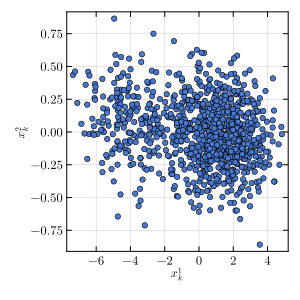

In [9]:
N = 1000
x₀ = zeros(Float64, 2,)
K₀ = [-0.2  -9.0]

X, U = f_dataGen_CL(x₀, K₀, N)
display(abs.(eigen(A + B * K₀).values))

plt = plot(
    framestyle = :box,
    yguidefontsize = 8,
    xguidefontsize = 8,
    xtickfontsize = 8,
    ytickfontsize = 8,
    ylabel = L"$x^2_k$",
    xlabel = L"$x^1_k$",
    palette = :seaborn_muted,
    legend=:none,
    foreground_color_legend = nothing,
    legendfontsize=5,
    fontfamily = "Computer Modern",
    markersize = 2,
)
plot_data_exp = scatter!(plt, X[1,:], X[2,:], markersize = 3, size = (300, 300)) 
#[:none, :auto, :circle, :rect, :star5, :diamond, :hexagon, :cross, :xcross, :utriangle, :dtriangle, :rtriangle, :ltriangle, :pentagon, :heptagon, :octagon, :star4, :star6, :star7, :star8, :vline, :hline, :+, :x].

We use the above input and state data, $U$ and $X$, respectively, to fit a linear model and design a new controller based on this identified model, in a certainty equivalence fashion.

In [10]:
AB = X[:,2:end] / [X[:,1:end-1]; U[:,1:end-1]]
Â = AB[:,1:rₓ]
B̂ = AB[:,rₓ+1:end]
err = X[:,2:end] - (Â * X[:,1:end-1] + B̂ * U[:,1:end-1])
Ŵ = err * err' / (N-1)
sys_estimate = ss(Â,B̂,I,0,Δ)

K_CE = -lqr(sys_estimate,Q,R)

1×2 Matrix{Float64}:
 -0.580477  -1.9114

We now use this certainty equivalence control law to control the true system.

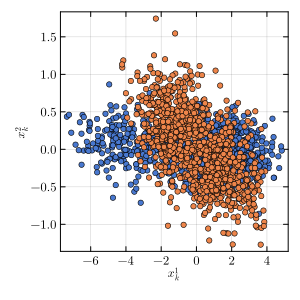

In [11]:
X_CE, _ = f_dataGen_CL(x₀, K_CE, N)
plot_CE = scatter(plot_data_exp, X_CE[1,:], X_CE[2,:], markersize = 3, markershape = :circle)

Notice that the two distributions do not share the same support exactly. That is,
the new system visits states that were not experienced during the experiment and learning phase. These regions of the state-space may contain nonlinearities, discontinuities, unpredicted safety violations. The responsibility of data-conforming control is to prevent such sudden generalization beyond learning data, and to enforce that the new system's distribution is close (under some norm) to the data distribution.

We solve Problem~5 with $\gamma$ set to $0$, expecting the same behavior as the solution of the CE-LQR problem. 

Lyupanov condition error: (L∞ norm) is 2.3910103230662116e-8


1×2 Matrix{Float64}:
 -0.096462  -1.6698

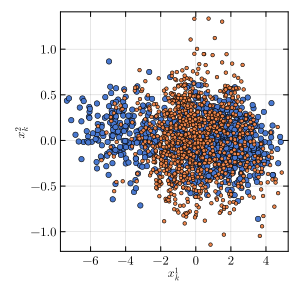

In [12]:
γ_prime = 20
K_prob5, _ = Prob5(Â, B̂, Q, R, Ŵ, V, X, γ_prime)
display(K_prob5)
X_prob5_0, _ = f_dataGen_CL(x₀, K_prob5, N)
plot_prob5_0 = scatter(plot_data_exp, X_prob5_0[1,:], X_prob5_0[2,:], markersize = 2)

We now plot some figures with different values of $\gamma$:

In [13]:
γ_prime = 100
K_prob5, _ = Prob5(Â, B̂, Q, R, Ŵ, V, X, γ_prime)
X_prob5_1, _ = f_dataGen_CL(x₀, K_prob5, N)
γ_prime = 1000
K_prob5, _ = Prob5(Â, B̂, Q, R, Ŵ, V, X, γ_prime)
X_prob5_2, _ = f_dataGen_CL(x₀, K_prob5, N);

Lyupanov condition error: (L∞ norm) is 4.795124830536679e-8
Lyupanov condition error: (L∞ norm) is 9.539680156933628e-9


In [14]:
x_minimum = minimum([minimum(X[1,:]), minimum(X_prob5_0[1,:]), minimum(X_prob5_1[1,:]), minimum(X_prob5_2[1,:])])
x_maximum = maximum([maximum(X[1,:]), maximum(X_prob5_0[1,:]), maximum(X_prob5_1[1,:]), maximum(X_prob5_2[1,:])])
x_limits = (x_minimum, x_maximum)

y_minimum = minimum([minimum(X[2,:]), minimum(X_prob5_0[2,:]), minimum(X_prob5_1[2,:]), minimum(X_prob5_2[2,:])])
y_maximum = maximum([maximum(X[2,:]), maximum(X_prob5_0[2,:]), maximum(X_prob5_1[2,:]), maximum(X_prob5_2[2,:])])
y_limits = (y_minimum, y_maximum)

plt = plot(
    framestyle = :box,
    yguidefontsize = 6,
    xguidefontsize = 6,
    xtickfontsize = 6,
    ytickfontsize = 6,
    ylabel = L"$x^2_k$",
    xlabel = L"$x^1_k$",
    palette = :seaborn_muted,
    legend=:none,
    foreground_color_legend = nothing,
    legendfontsize=5,
    fontfamily = "Computer Modern",
    markersize = 2,
    titlefontsize = 6,
)
MarkerSize = 2
plot_CE = scatter(plt, X_CE[1,:], X_CE[2,:], markersize = MarkerSize, markershape = :xcross, bottom_margin = [-2mm 0mm], title = "(a)")
plot_prob5_0 = scatter(plt, X_prob5_0[1,:], X_prob5_0[2,:], markersize = MarkerSize, markershape = :xcross, bottom_margin = [-2mm 0mm], title = "(b)")
plot_prob5_1 = scatter(plt, X_prob5_1[1,:], X_prob5_1[2,:], markersize = MarkerSize, markershape = :xcross, bottom_margin = [-2mm 0mm], title = "(c)")
plot_prob5_20 = scatter(plt, X_prob5_2[1,:], X_prob5_2[2,:], markersize = MarkerSize, markershape = :xcross, bottom_margin = [-2mm 0mm], title = "(d)")
plots_list = [plot_CE, plot_prob5_0, plot_prob5_1, plot_prob5_20]
for i = 1:length(plots_list)
    scatter!(plots_list[i], X[1,:], X[2,:], xlims = x_limits, ylims = y_limits, xlabel = "", ylabel = "", 
    xticks = [ceil(x_minimum), 0, floor(x_maximum)], yticks = [ceil(y_minimum), 0, floor(y_maximum)], 
    markersize = MarkerSize, markerstrokewidth=1, markershape = :rect)
end


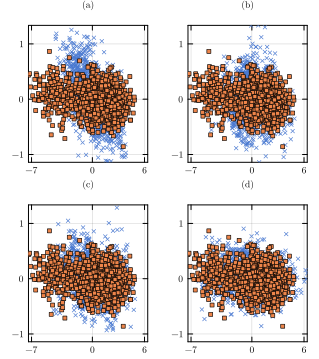

In [15]:
width = 320
height = 360
Fig1 = plot(plot_CE, plot_prob5_0, plot_prob5_1, plot_prob5_20, layout = (2,2), size = (width, height))

In [16]:
Fig1
savefig("figs/Prob5.pdf")

"/Users/mohammad/Documents/GitHub/robust-less-dist-shifts/data-conforming-control/figs/Prob5.pdf"

Now, we try to solve the corresponding Problem~6 of this problem above.

1×2 Matrix{Float64}:
 -0.104643  -7.47009

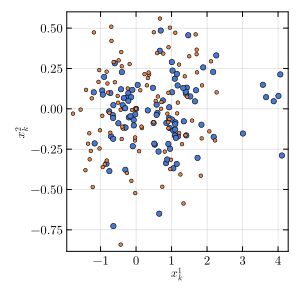

In [50]:
γ = 10
K_prob6, _ = Prob6(Â, B̂, Q, R, Ŵ, V, X, U, γ)
display(K_prob6)
X_prob6, _ = f_dataGen_CL(x₀, K_prob6, N)
plot_prob6 = scatter(plot_data_exp, X_prob6[1,:], X_prob6[2,:], markersize = 2, order = 1)

Now, to make things more interesting, we add a nonlinearity to the linear system (the function $f$) that will render a non-data-conforming control unstable.

In [110]:
function f(x::Vector{Float64}, u::Vector{Float64})
    x⁺ = zero.(x);
    x⁺ = A * x + B * u + sqrt(W) * randn(size(x⁺))
    x⁺[1] += 1/9 * x[2] ^ 2
    return x⁺
end

f (generic function with 1 method)

We now generate data using the simulation experiment with the initial control gain $K_0$.

In [187]:
N = 500
x₀ = zeros(Float64, 2,)
K₀ = [-0.2  -9.0]

X, U = f_dataGen_CL(x₀, K₀, N)
x₀ = X[:,end];

We fit a new model using the new data, and solve Problem~3.

In [194]:
AB = X[:,2:end] / [X[:,1:end-1]; U[:,1:end-1]]
Â = AB[:,1:rₓ]
B̂ = AB[:,rₓ+1:end]
sys_estimate = ss(Â,B̂,I,0,Δ)

K_CE = -lqr(sys_estimate,Q,R)
N = 1000
X_CE, _ = f_dataGen_CL(x₀, K_CE, N);

We also solve Problem~6 with multiple values of $\gamma$:

In [195]:
γ_prime = 20
K_prob5, _ = Prob5(Â, B̂, Q, R, Ŵ, V, X, γ_prime)
X_prob5_0, _ = f_dataGen_CL(x₀, K_prob5, N);

In [196]:
γ_prime = 100
K_prob5, _ = Prob5(Â, B̂, Q, R, Ŵ, V, X, γ_prime)
X_prob5_1, _ = f_dataGen_CL(x₀, K_prob5, N);

In [197]:
γ_prime = 1000
K_prob5, _ = Prob5(Â, B̂, Q, R, Ŵ, V, X, γ_prime)
X_prob5_2, _ = f_dataGen_CL(x₀, K_prob5, N);

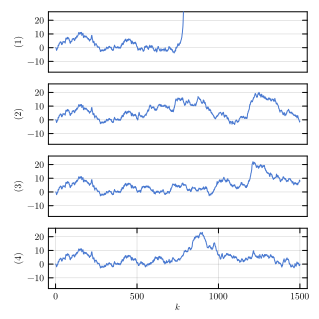

In [198]:
x_minimum = minimum(X[1,:]) - 15
x_maximum = maximum(X[1,:]) + 15

plt = plot(
    framestyle = :box,
    yguidefontsize = 6,
    xguidefontsize = 6,
    xtickfontsize = 6,
    ytickfontsize = 6,
    ylims = (x_minimum, x_maximum),
    palette = :seaborn_muted,
    legend=:none,
    foreground_color_legend = nothing,
    legendfontsize=5,
    fontfamily = "Computer Modern",
    markersize = 2,
    titlefontsize = 6,
)
MarkerSize = 2
plot_CE = plot(plt, [X[1,:];X_CE[1,:]], bottom_margin = [-2mm 0mm], ylims = (x_minimum, x_maximum), xticks = :none, ylabel = "(1)")
plot_prob5_0 = plot(plt, [X[1,:];X_prob5_0[1,:]], bottom_margin = [-2mm 0mm], ylims = (x_minimum, x_maximum), xticks = :none, ylabel = "(2)")
plot_prob5_1 = plot(plt, [X[1,:];X_prob5_1[1,:]], bottom_margin = [-2mm 0mm], ylims = (x_minimum, x_maximum), xticks = :none, ylabel = "(3)")
plot_prob5_20 = plot(plt, [X[1,:];X_prob5_2[1,:]], bottom_margin = [-2mm 0mm], ylims = (x_minimum, x_maximum), xlabel = L"$k$", ylabel = "(4)")
plots_list = [plot_CE, plot_prob5_0, plot_prob5_1, plot_prob5_20]
for i = 1:length(plots_list)
    #plot!(plots_list[i], X[1,:], ylims = (x_minimum, x_maximum))
end

width = 320
height = 320
Fig2 = plot(plot_CE, plot_prob5_0, plot_prob5_1, plot_prob5_20, layout = (4,1), size = (width, height))

In [199]:
Fig2
savefig("figs/Prob5_nonlinear.pdf")

"/Users/mohammad/Documents/GitHub/robust-less-dist-shifts/data-conforming-control/figs/Prob5_nonlinear.pdf"

We now repeat the whole procedure above bunch of times to get some statistics about the stability of the above control design procedures.

In [117]:
stability_count = zeros(4,)
threshold = 50
N = 500
N2 = 1000
num_of_simulations = 1000
for j = 1:num_of_simulations
stability_condition = false
while ~stability_condition
    x₀ = zeros(Float64, 2,)
    K₀ = [-0.2  -9.0]
    X, U = f_dataGen_CL(x₀, K₀, N)
    # check stability (boundedness) of the experimental data:
    maximum_state = maximum(abs.(X))
    if maximum_state >= threshold
        stability_condition = false
    else
        stability_condition = true
    end
end
AB = X[:,2:end] / [X[:,1:end-1]; U[:,1:end-1]]
Â = AB[:,1:rₓ]
B̂ = AB[:,rₓ+1:end]
sys_estimate = ss(Â,B̂,I,0,Δ)

# CE control
K_CE = -lqr(sys_estimate,Q,R)
X_CE, _ = f_dataGen_CL(x₀, K_CE, N2)
maximum_state = maximum(abs.(X_CE))
    if maximum_state <= threshold
        stability_count[1] += 1
    end
# Data conforming
γ_prime = 20.0
K_prob5, _ = Prob5(Â, B̂, Q, R, Ŵ, V, X, γ_prime)
X_prob5_0, _ = f_dataGen_CL(x₀, K_prob5, N2);
maximum_state = maximum(abs.(X_prob5_0))
    if maximum_state <= threshold
        stability_count[2] += 1
    end

γ_prime = 100
K_prob5, _ = Prob5(Â, B̂, Q, R, Ŵ, V, X, γ_prime)
X_prob5_1, _ = f_dataGen_CL(x₀, K_prob5, N2);
maximum_state = maximum(abs.(X_prob5_1))
    if maximum_state <= threshold
        stability_count[3] += 1
    end
γ_prime = 1000
K_prob5, _ = Prob5(Â, B̂, Q, R, Ŵ, V, X, γ_prime)
X_prob5_2, _ = f_dataGen_CL(x₀, K_prob5, N2);
maximum_state = maximum(abs.(X_prob5_2))
    if maximum_state <= threshold
        stability_count[4] += 1
    end

end

println("The following are the percentages of stable simulations by each controller:")
display(stability_count./num_of_simulations)

4-element Vector{Float64}:
 0.39
 0.922
 0.968
 0.984

We fit a new model using the new data, and solve Problem~3.

We also solve Problem~6 with multiple values of $\gamma$:

## State-input joint data-conforming:

Suppose now that the state dynamics contain cross state-input terms, for instance:

In [118]:
function f(x::Vector{Float64}, u::Vector{Float64})
    x⁺ = zero.(x);
    x⁺ = A * x + B * u + sqrt(W) * randn(size(x⁺))
    x⁺[1] += 1/9 * x[2] ^ 2
    x⁺[2] +=  1/9*tanh(1*x[1]) * u[1]
    return x⁺
end

f (generic function with 1 method)

We now generate data using the simulation experiment with the initial control gain $K_0$.

In [165]:
x₀ = zeros(Float64, 2,)
K₀ = [-0.2  -9.0]

X, U = f_dataGen_CL(x₀, K₀, N)
x₀ = X[:,end];

We fit a new model using the new data, and solve Problem~3.

In [166]:
AB = X[:,2:end] / [X[:,1:end-1]; U[:,1:end-1]]
Â = AB[:,1:rₓ]
B̂ = AB[:,rₓ+1:end]
sys_estimate = ss(Â,B̂,I,0,Δ)

K_CE = -lqr(sys_estimate,Q,R)
X_CE, _ = f_dataGen_CL(x₀, K_CE, N);

We also solve Problem~6 with multiple values of $\gamma$:

In [167]:
N1 = N
N1 = N2
γ_prime = 0.0
K_prob5_0, _ = Prob5(Â, B̂, Q, R, Ŵ, V, X, γ_prime);

In [168]:
γ_prime = 20
K_prob5_1, _ = Prob5(Â, B̂, Q, R, Ŵ, V, X, γ_prime);

In [169]:
γ_prime = 1000
K_prob5_2, _ = Prob5(Â, B̂, Q, R, Ŵ, V, X, γ_prime);

In [170]:
γ = 10
K_prob6, _ = Prob6(Â, B̂, Q, R, Ŵ, V, X, U, γ);

In [ ]:
X_prob5_0, _ = f_dataGen_CL(x₀, K_prob5_0, N1);
X_prob5_1, _ = f_dataGen_CL(x₀, K_prob5_1, N1);
X_prob5_2, _ = f_dataGen_CL(x₀, K_prob5_2, N1);
X_prob6, _ = f_dataGen_CL(x₀, K_prob6, N1)


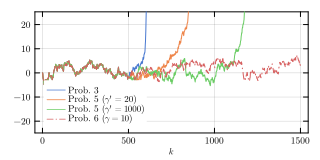

In [172]:
x_minimum = minimum(X[1,:]) - 20
x_maximum = maximum(X[1,:]) + 20
plt = plot(
    framestyle = :box,
    yguidefontsize = 6,
    xguidefontsize = 6,
    xtickfontsize = 6,
    ytickfontsize = 6,
    ylims = (x_minimum, x_maximum),
    palette = :seaborn_muted,
    legend=:bottomleft,
    foreground_color_legend = nothing,
    legendfontsize=6,
    fontfamily = "Computer Modern",
    markersize = 2,
    titlefontsize = 6,
)
MarkerSize = 2
plot_CE = plot(plt, [X[1,:];X_CE[1,:]], bottom_margin = [-2mm 0mm], ylims = (x_minimum, x_maximum), label = "Prob. 3")
plot_prob5_1 = plot(plot_CE, [X[1,:];X_prob5_1[1,:]], bottom_margin = [-2mm 0mm], ylims = (x_minimum, x_maximum), label = L"Prob. 5 ($\gamma'=20$)")
plot_prob5_20 = plot(plot_prob5_1, [X[1,:];X_prob5_2[1,:]], bottom_margin = [-2mm 0mm], ylims = (x_minimum, x_maximum), label = L"Prob. 5 ($\gamma'=1000$)")
plot_prob6 = plot(plot_prob5_20, [X[1,:];X_prob6[1,:]], bottom_margin = [0mm 0mm], 
ylims = (x_minimum, x_maximum), xlabel = L"$k$", label = L"Prob. 6 ($\gamma=10$)", linestyle = :dashdot)


width = 320
height = 160
Fig3 = plot(plot_prob6, size = (width, height))

In [173]:
Fig3
savefig("figs/Prob5_bilinear.pdf")

"/Users/mohammad/Documents/GitHub/robust-less-dist-shifts/data-conforming-control/figs/Prob5_bilinear.pdf"

Similar to the previous example, we run a bunch of simulations and count the number of stable simulations offered by each control:

In [174]:
stability_count = zeros(4,)
num_of_simulations = 1000
N = 500
N2 = 1000
for j = 1:num_of_simulations
stability_condition = false
while ~stability_condition
    x₀ = zeros(Float64, 2,)
    K₀ = [-0.2  -9.0]
    X, U = f_dataGen_CL(x₀, K₀, N)
    # check stability (boundedness) of the experimental data:
    maximum_state = maximum(abs.(X))
    if maximum_state >= threshold
        stability_condition = false
    else
        stability_condition = true
    end
end
AB = X[:,2:end] / [X[:,1:end-1]; U[:,1:end-1]]
Â = AB[:,1:rₓ]
B̂ = AB[:,rₓ+1:end]
sys_estimate = ss(Â,B̂,I,0,Δ)

# CE
γ_prime = 0.0
K_prob5, _ = Prob5(Â, B̂, Q, R, Ŵ, V, X, γ_prime)
X_prob5_0, _ = f_dataGen_CL(x₀, K_prob5, N2);
maximum_state = maximum(abs.(X_prob5_0))
    if maximum_state <= threshold
        stability_count[1] += 1
    end

# State-data conforming
γ_prime = 20
K_prob5, _ = Prob5(Â, B̂, Q, R, Ŵ, V, X, γ_prime)
X_prob5_1, _ = f_dataGen_CL(x₀, K_prob5, N2);
maximum_state = maximum(abs.(X_prob5_1))
    if maximum_state <= threshold
        stability_count[2] += 1
    end

γ_prime = 1000
K_prob5, _ = Prob5(Â, B̂, Q, R, Ŵ, V, X, γ_prime)
X_prob5_2, _ = f_dataGen_CL(x₀, K_prob5, N2);
maximum_state = maximum(abs.(X_prob5_2))
    if maximum_state <= threshold
        stability_count[3] += 1
    end

# Joint state-input data-conforming
γ = 10
K_prob6, _ = Prob6(Â, B̂, Q, R, Ŵ, V, X, U, γ)
println("K_prob6 = ", K_prob6)
X_prob6, _ = f_dataGen_CL(x₀, K_prob6, N2)
maximum_state = maximum(abs.(X_prob6))
    if maximum_state <= threshold
        stability_count[4] += 1
    end

end

println("The following are the percentages of stable simulations by each controller:")
display(stability_count./num_of_simulations)

4-element Vector{Float64}:
 0.222
 0.519
 0.507
 0.999

In [70]:
@time Prob6(Â, B̂, Q, R, Ŵ, V, X, U, γ);